In [1]:
import os, glob
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from IPython.display import Image, display

import sys
sys.path.append('..')
import helpers, datasets, surfaces, matrices

sns.set_style('ticks')

/home/asaberi/laminar_organization/env/lib/python3.9/site-packages/nilearn/input_data/__init__.py:27: FutureWarning: The import path 'nilearn.input_data' is deprecated in version 0.9. Importing from 'nilearn.input_data' will be possible at least until release 0.13.0. Please import from 'nilearn.maskers' instead.
  warnings.warn(message, FutureWarning)


# Fig I. Microcircuitry in association with cortical hierarchy and the principal axis of laminar thickness covariance

## a) Excitatory subtypes

Subtype maps

In [2]:
exc_types = surfaces.NeuronalSubtypesMaps('exc', 'schaefer400')

Ex1
0 of 14 genes do not exist
Ex2
1 of 9 genes do not exist
Ex3
0 of 4 genes do not exist
Ex4
1 of 12 genes do not exist
Ex5
0 of 8 genes do not exist
Ex6
2 of 33 genes do not exist
Ex7
0 of 3 genes do not exist
Ex8
5 of 57 genes do not exist


/home/asaberi/laminar_organization/env/lib/python3.9/site-packages/brainspace/plotting/surface_plotting.py:437: RuntimeWarning: Running plot_hemispheres without a display may result in a crash. For a workaround please consult https://github.com/MICA-MNI/BrainSpace/issues/66. To suppress this warning set suppress_warnings=True.
  warnings.warn(


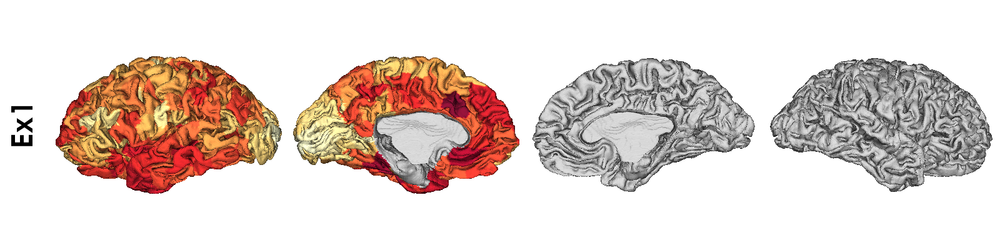

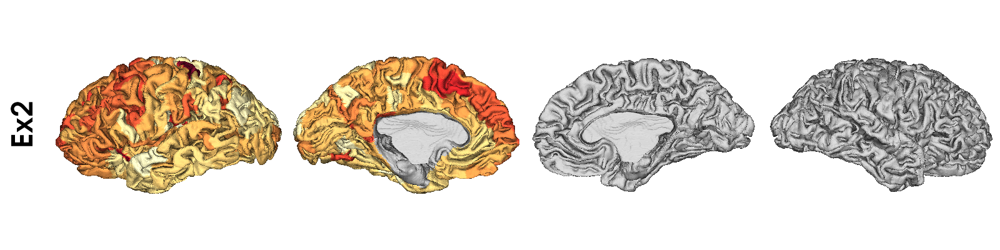

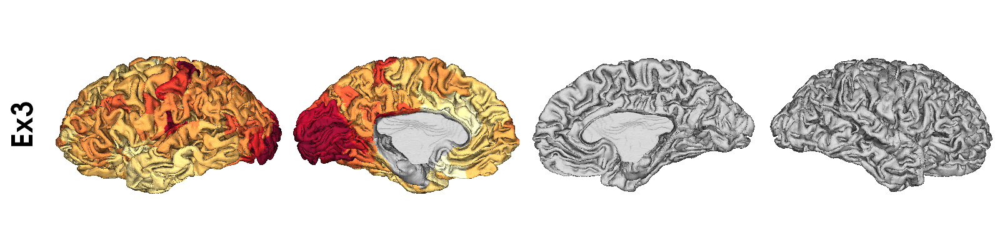

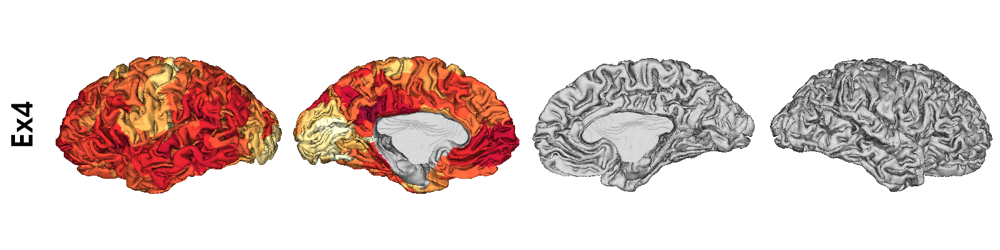

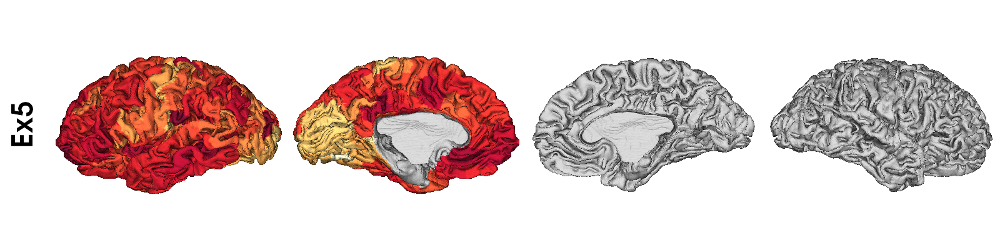

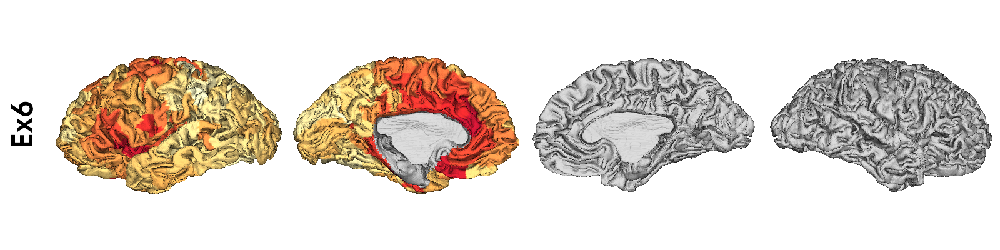

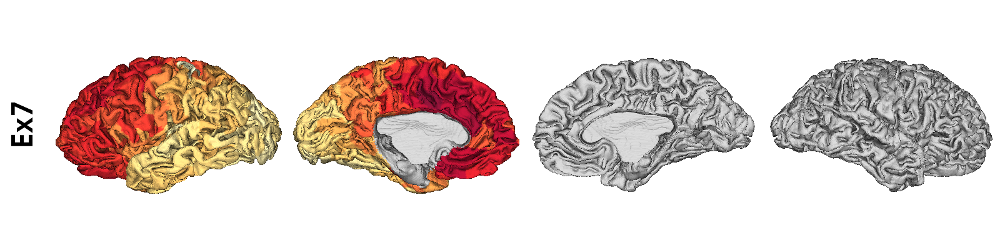

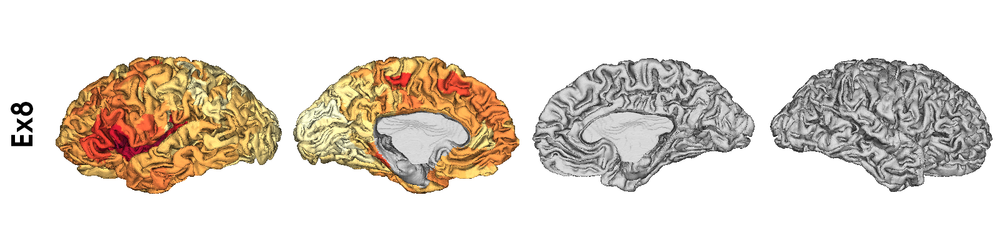

In [3]:
display(*exc_types.plot(inflate=False, label_loc='left'))

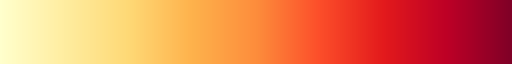

In [4]:
sns.color_palette(exc_types.cmap, as_cmap=True)

## b) Association of excitatory subtypes with LTC G1 and hierarchy maps

Correlation with LTC G1:

Loading the matrix from /home/asaberi/laminar_organization/code/../output/ltc/parc-schaefer400_curv-smooth-10_exc-adysgranular_metric-parcor/matrix.npz
Loading the matrix from /home/asaberi/laminar_organization/code/../output/ltc/parc-schaefer1000_curv-smooth-10_exc-adysgranular_metric-parcor/matrix.npz
Loading the matrix from /home/asaberi/laminar_organization/code/../output/ltc/parc-schaefer1000_curv-smooth-10_exc-adysgranular_metric-parcor/matrix.npz
Calculating correlations with variogram test (parcellated)
Creating 1000 surrogates based on variograms in /home/asaberi/laminar_organization/code/../output/ltc/parc-schaefer400_curv-smooth-10_exc-adysgranular_metric-parcor/gradients_approach-pca_kernel-normalized_angle_sparsity-09_n-10/variogram_surrogates_LTC G1_nperm-1000_nparcels-179.npz
Loading the matrix from /home/asaberi/laminar_organization/code/../output/distance/geodesic_distance_matrix_parc-schaefer400_approach-center-to-center.npz

Correlation coefficients


,LTC G1
Ex1,-0.017355
Ex2,-0.282842
Ex3,0.238701
Ex4,0.001864
Ex5,-0.154610
Ex6,-0.548069
Ex7,-0.487482
Ex8,-0.564923



p-values


,LTC G1
Ex1,0.982
Ex2,0.000
Ex3,0.000
Ex4,0.982
Ex5,0.016
Ex6,0.000
Ex7,0.000
Ex8,0.000


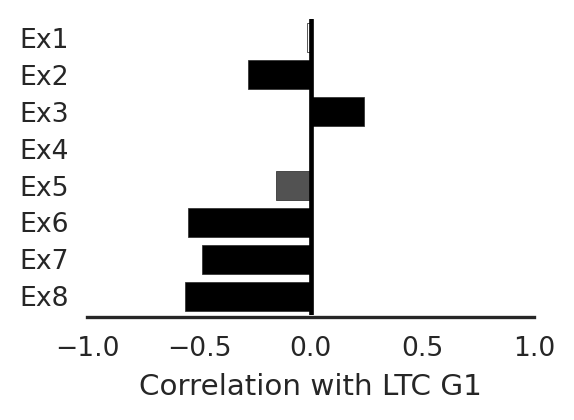

In [5]:
ltcg = surfaces.MicrostructuralCovarianceGradients(matrices.MicrostructuralCovarianceMatrix('thickness', 'schaefer400'))
r, p = ltcg.correlate(exc_types, x_columns=['LTC G1'], fdr_axis='y', regplot=False)
print("\nCorrelation coefficients")
display(r)
print("\np-values")
display(p)

Correlation with laminar-based hierarchy:

Input parameters:
              --in_space : bigbrain
              --out_space : fs_LR
              --bb_space : histological
              --wd : /home/asaberi/laminar_organization/code/../output/ei/exc_parc-schaefer400_rh_discarded/macaque
              --desc : Ex6
              --in_vol : 
              --in_lh : /home/asaberi/laminar_organization/code/../output/ei/exc_parc-schaefer400_rh_discarded/tpl-bigbrain_hemi-L_desc-Ex6.shape.gii
              --in_rh : /home/asaberi/laminar_organization/code/../output/ei/exc_parc-schaefer400_rh_discarded/tpl-bigbrain_hemi-L_desc-Ex6.shape.gii
              --interp : nearest
              --out_type : surface
              --out_den : 32
              --out_res : 
employed multimodal surface matching transformation from bigbrain surface to fs_LR
Input parameters:
              --in_space : bigbrain
              --out_space : fs_LR
              --bb_space : histological
              --wd : /home/asaberi/laminar_organization/code/../outp

,Laminar-based hierarchy
Ex1,0.634631
Ex2,-0.023428
Ex3,-0.699313
Ex4,0.233176
Ex5,0.513770
Ex6,0.556218
Ex7,0.366621
Ex8,0.501388



p-values


,Laminar-based hierarchy
Ex1,0.000000
Ex2,0.825000
Ex3,0.000000
Ex4,0.022857
Ex5,0.000000
Ex6,0.000000
Ex7,0.000000
Ex8,0.000000


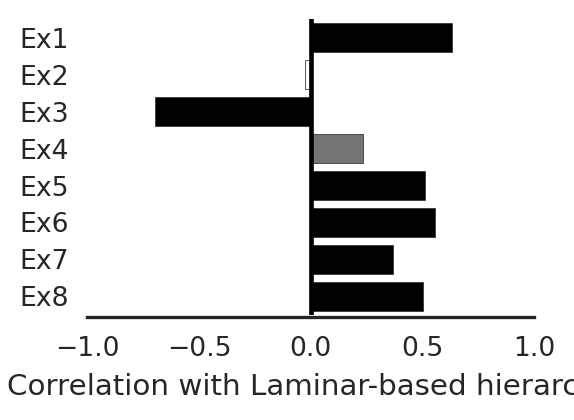

In [6]:
# transform exc types maps to macaque space
exc_types_macaque = surfaces.MacaqueSurface(exc_types)
macaque_hierarchy = surfaces.MacaqueHierarchy()
r, p = macaque_hierarchy.correlate(exc_types_macaque, fdr_axis='y', regplot=False)
print("\nCorrelation coefficients")
display(r)
print("\np-values")
display(p)

Correlation with asymmetry-based hierarchy:

Calculating correlations with variogram test (parcellated)
Surrogates already exist in /home/asaberi/laminar_organization/code/../output/connectivity/ec_parc-schaefer400_data-mics/maps/variogram_surrogates_hierarchy_nperm-1000_nparcels-200.npz and have the same parcels

Correlation coefficient


,hierarchy
Ex1,0.162884
Ex2,0.235522
Ex3,-0.210831
Ex4,0.130528
Ex5,0.111899
Ex6,0.293983
Ex7,0.252896
Ex8,0.440616



p-value


,hierarchy
Ex1,0.020000
Ex2,0.002000
Ex3,0.003200
Ex4,0.029714
Ex5,0.091000
Ex6,0.000000
Ex7,0.000000
Ex8,0.000000


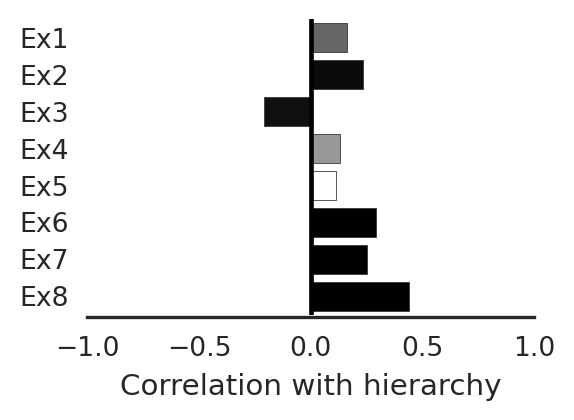

In [7]:
ec_maps = surfaces.EffectiveConnectivityMaps(dataset='mics')
r, p = ec_maps.correlate(exc_types, x_columns=['hierarchy'], fdr_axis='y', regplot=False)
print("\nCorrelation coefficient")
display(r)
print("\np-value")
display(p)

## a) Inhibitory subtypes

Subtype maps

In [8]:
inh_types = surfaces.NeuronalSubtypesMaps('inh', 'schaefer400')

In1
0 of 2 genes do not exist
In2
0 of 4 genes do not exist
In3
0 of 12 genes do not exist
In4
0 of 6 genes do not exist
In5
2 of 7 genes do not exist
In6
0 of 4 genes do not exist
In7
0 of 6 genes do not exist
In8
0 of 1 genes do not exist


/home/asaberi/laminar_organization/env/lib/python3.9/site-packages/brainspace/plotting/surface_plotting.py:437: RuntimeWarning: Running plot_hemispheres without a display may result in a crash. For a workaround please consult https://github.com/MICA-MNI/BrainSpace/issues/66. To suppress this warning set suppress_warnings=True.
  warnings.warn(


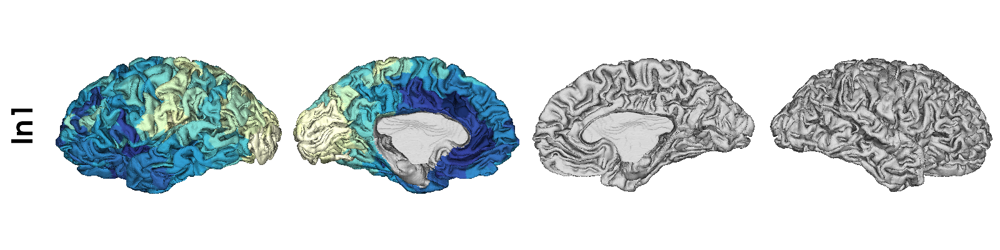

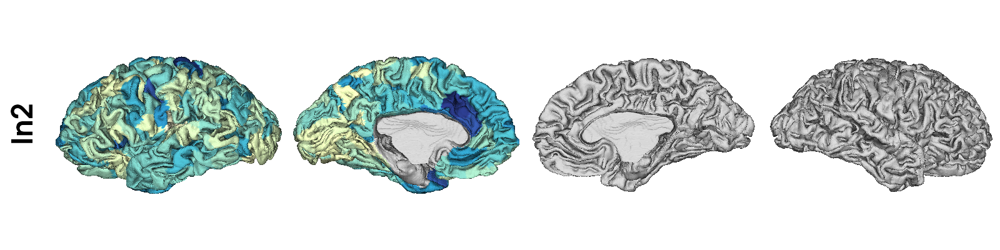

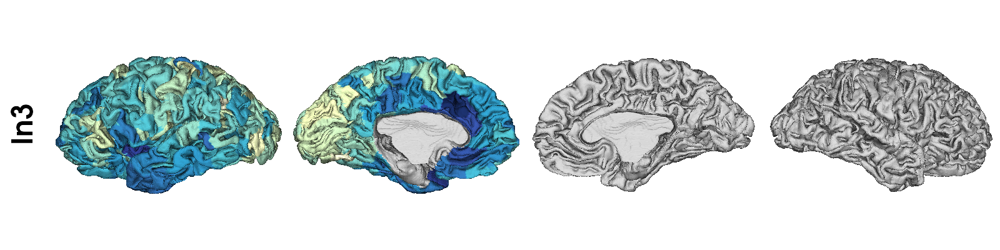

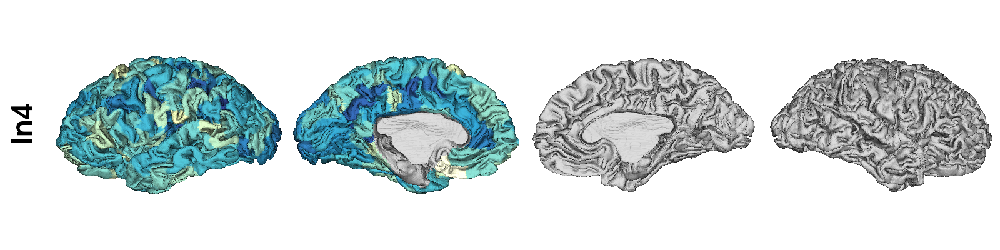

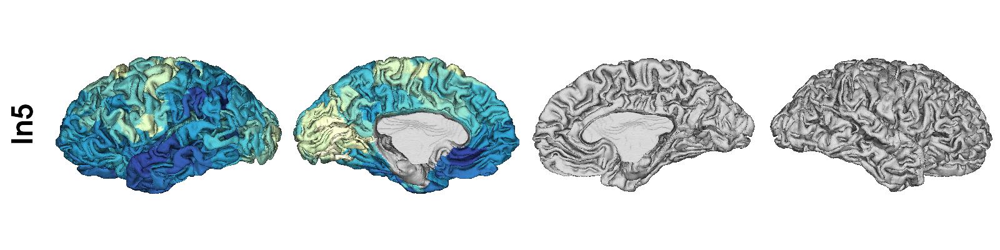

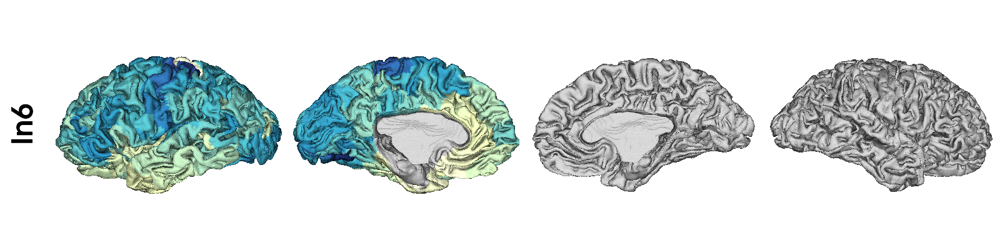

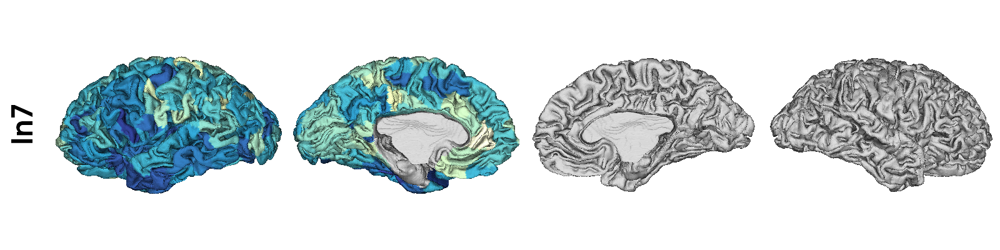

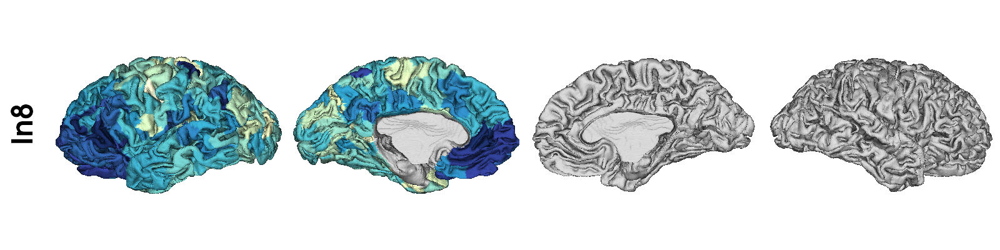

In [9]:
display(*inh_types.plot(inflate=False, label_loc='left'))

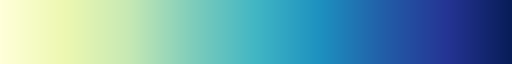

In [10]:
sns.color_palette(inh_types.cmap, as_cmap=True)

Correlation with LTC G1:

Loading the matrix from /home/asaberi/laminar_organization/code/../output/ltc/parc-schaefer400_curv-smooth-10_exc-adysgranular_metric-parcor/matrix.npz
Loading the matrix from /home/asaberi/laminar_organization/code/../output/ltc/parc-schaefer1000_curv-smooth-10_exc-adysgranular_metric-parcor/matrix.npz
Loading the matrix from /home/asaberi/laminar_organization/code/../output/ltc/parc-schaefer1000_curv-smooth-10_exc-adysgranular_metric-parcor/matrix.npz
Calculating correlations with variogram test (parcellated)
Surrogates already exist in /home/asaberi/laminar_organization/code/../output/ltc/parc-schaefer400_curv-smooth-10_exc-adysgranular_metric-parcor/gradients_approach-pca_kernel-normalized_angle_sparsity-09_n-10/variogram_surrogates_LTC G1_nperm-1000_nparcels-179.npz and have the same parcels

Correlation coefficients


,LTC G1
In1,-0.428013
In2,-0.029624
In3,-0.296461
In4,0.185102
In5,0.022502
In6,-0.077585
In7,-0.299077
In8,-0.246416



p-values


,LTC G1
In1,0.0000
In2,0.7520
In3,0.0000
In4,0.0112
In5,0.8060
In6,0.4720
In7,0.0000
In8,0.0000


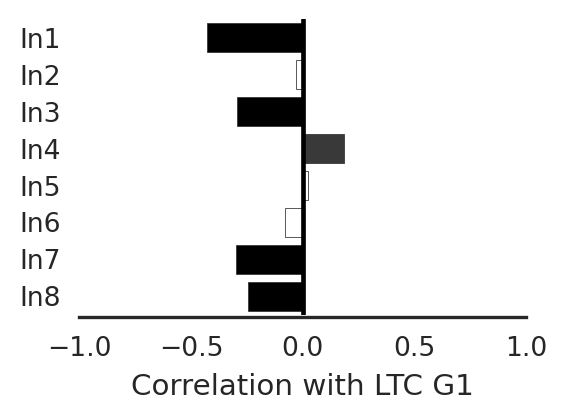

In [11]:
ltcg = surfaces.MicrostructuralCovarianceGradients(matrices.MicrostructuralCovarianceMatrix('thickness', 'schaefer400'))
r, p = ltcg.correlate(inh_types, x_columns=['LTC G1'], fdr_axis='y', regplot=False)
print("\nCorrelation coefficients")
display(r)
print("\np-values")
display(p)

Correlation with laminar-based hierarchy:

Input parameters:
              --in_space : bigbrain
              --out_space : fs_LR
              --bb_space : histological
              --wd : /home/asaberi/laminar_organization/code/../output/ei/inh_parc-schaefer400_rh_discarded/macaque
              --desc : In1
              --in_vol : 
              --in_lh : /home/asaberi/laminar_organization/code/../output/ei/inh_parc-schaefer400_rh_discarded/tpl-bigbrain_hemi-L_desc-In1.shape.gii
              --in_rh : /home/asaberi/laminar_organization/code/../output/ei/inh_parc-schaefer400_rh_discarded/tpl-bigbrain_hemi-L_desc-In1.shape.gii
              --interp : nearest
              --out_type : surface
              --out_den : 32
              --out_res : 
employed multimodal surface matching transformation from bigbrain surface to fs_LR
Input parameters:
              --in_space : bigbrain
              --out_space : fs_LR
              --bb_space : histological
              --wd : /home/asaberi/laminar_organization/code/../outp

,Laminar-based hierarchy
In1,0.745939
In2,0.536357
In3,0.686836
In4,-0.226859
In5,0.303468
In6,-0.705536
In7,0.180567
In8,0.088425



p-values


,Laminar-based hierarchy
In1,0.0000
In2,0.0000
In3,0.0000
In4,0.0920
In5,0.0032
In6,0.0000
In7,0.1120
In8,0.2310


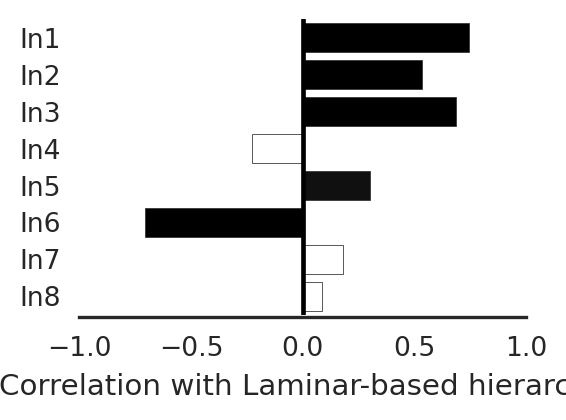

In [12]:
# transform exc types maps to macaque space
inh_types_macaque = surfaces.MacaqueSurface(inh_types)
macaque_hierarchy = surfaces.MacaqueHierarchy()
r, p = macaque_hierarchy.correlate(inh_types_macaque, fdr_axis='y', regplot=False)
print("\nCorrelation coefficients")
display(r)
print("\np-values")
display(p)

Correlation with asymmetry-based hierarchy:

Calculating correlations with variogram test (parcellated)
Surrogates already exist in /home/asaberi/laminar_organization/code/../output/connectivity/ec_parc-schaefer400_data-mics/maps/variogram_surrogates_hierarchy_nperm-1000_nparcels-200.npz and have the same parcels

Correlation coefficient


,hierarchy
In1,0.352652
In2,0.036996
In3,0.211407
In4,-0.046915
In5,0.073741
In6,-0.082325
In7,0.242952
In8,0.122514



p-value


,hierarchy
In1,0.000000
In2,0.652000
In3,0.010667
In4,0.652000
In5,0.416000
In6,0.401600
In7,0.000000
In8,0.066000


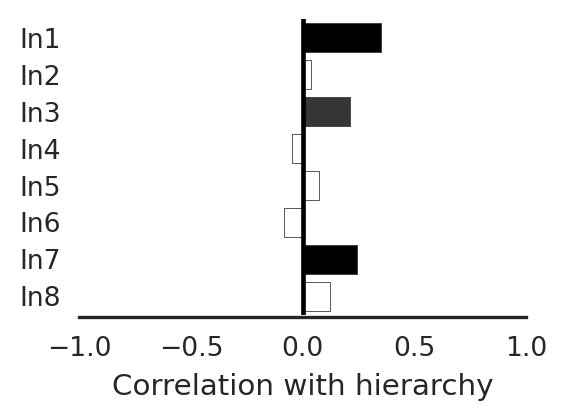

In [13]:
ec_maps = surfaces.EffectiveConnectivityMaps(dataset='mics')
r, p = ec_maps.correlate(inh_types, x_columns=['hierarchy'], fdr_axis='y', regplot=False)
print("\nCorrelation coefficient")
display(r)
print("\np-value")
display(p)

# Fig II. Correlated gene expression in association with laminar thickness covariance

In [4]:
ahba_df = datasets.fetch_ahba_data(
    parcellation_name='schaefer400', 
    ibf_threshold=0.5, missing='centroids')['all']

(0.0, 200.0, 15631.0, 0.0)

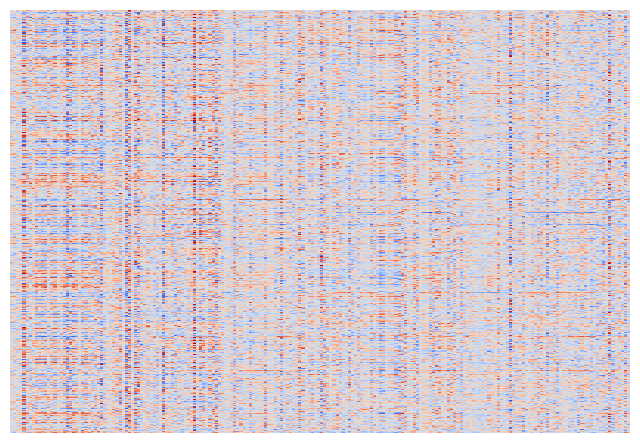

In [7]:
ax = sns.heatmap(ahba_df.values.T, cmap='coolwarm', cbar=False)
ax.axis('off')

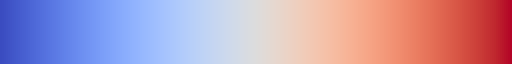

In [3]:
sns.color_palette('coolwarm', as_cmap=True)

CGE matrix:

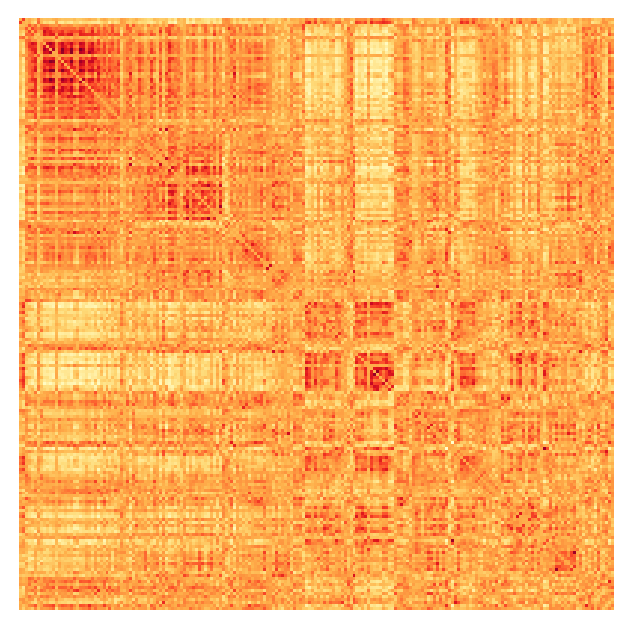

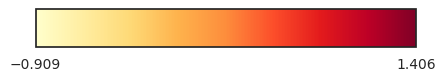

In [4]:
cge = matrices.CorrelatedGeneExpressionMatrix('schaefer400', brain_specific=False)
cge.plot(vrange=(0, 1))

Correlation of LTC with CGE:

Loading the matrix from /home/asaberi/laminar_organization/code/../output/ltc/parc-schaefer400_curv-smooth-10_exc-adysgranular_metric-parcor/matrix.npz
Pearson correlation with Correlated gene expression
Coef: 0.24310923287751726; p-value (spin): 0.001


(0.24310923287751726, 0.001)

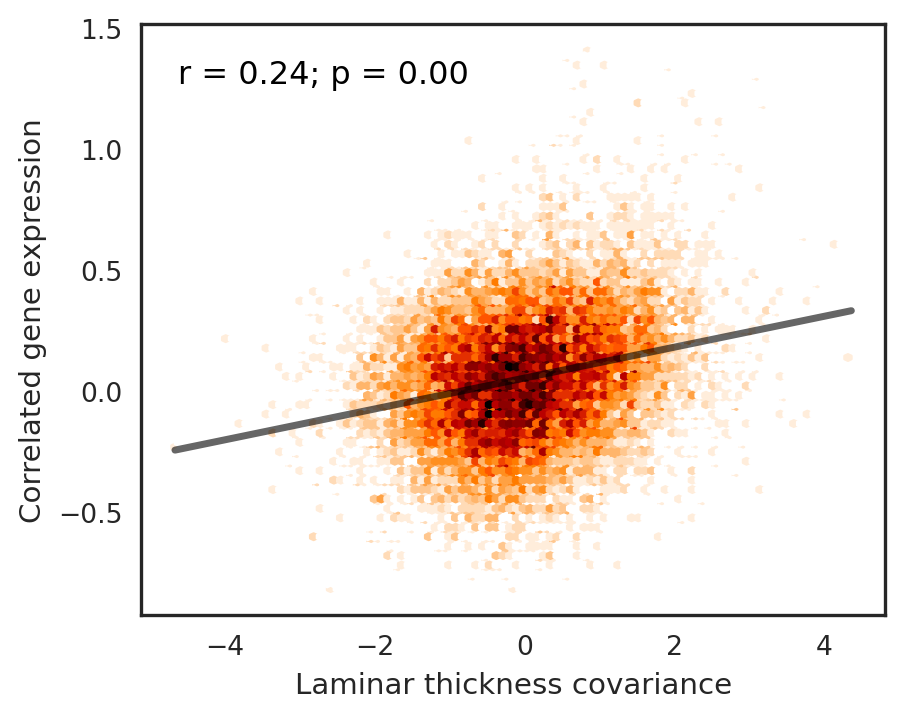

In [5]:
ltc = matrices.MicrostructuralCovarianceMatrix('thickness', 'schaefer400')
ltc.correlate_edge_wise(cge, axis_off=False, figsize=(5,4))

# Fig III. Developmental enrichment of genes expressed in alignment with the principal axis of laminar thickness covariance

In [9]:
ltcg = surfaces.MicrostructuralCovarianceGradients(matrices.MicrostructuralCovarianceMatrix('thickness', 'schaefer400'))
top_genes, pls = ltcg.ahba_pls(['LTC G1'])

Loading the matrix from /home/asaberi/laminar_organization/code/../output/ltc/parc-schaefer400_curv-smooth-10_exc-adysgranular_metric-parcor/matrix.npz
Loading the matrix from /home/asaberi/laminar_organization/code/../output/ltc/parc-schaefer1000_curv-smooth-10_exc-adysgranular_metric-parcor/matrix.npz
Loading the matrix from /home/asaberi/laminar_organization/code/../output/ltc/parc-schaefer1000_curv-smooth-10_exc-adysgranular_metric-parcor/matrix.npz


0 of 267 genes do not exist


/home/asaberi/laminar_organization/env/lib/python3.9/site-packages/brainspace/plotting/surface_plotting.py:437: RuntimeWarning: Running plot_hemispheres without a display may result in a crash. For a workaround please consult https://github.com/MICA-MNI/BrainSpace/issues/66. To suppress this warning set suppress_warnings=True.
  warnings.warn(


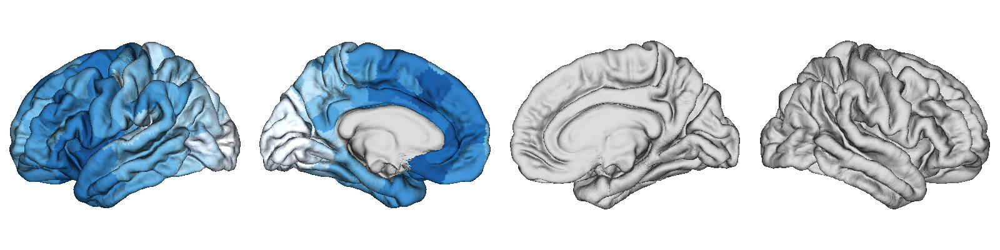

In [10]:
helpers.plot_surface(
    helpers.deparcellate(datasets.fetch_aggregate_gene_expression(top_genes[0]['pos'], 'schaefer400', ibf_threshold=0.5), 'schaefer400', space='fsaverage'),
    inflate=False, cmap='Blues', plot_downsampled=False, space='fsaverage'
)

/home/asaberi/laminar_organization/code/figures/../helpers.py:996: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(stages_order, rotation=90);


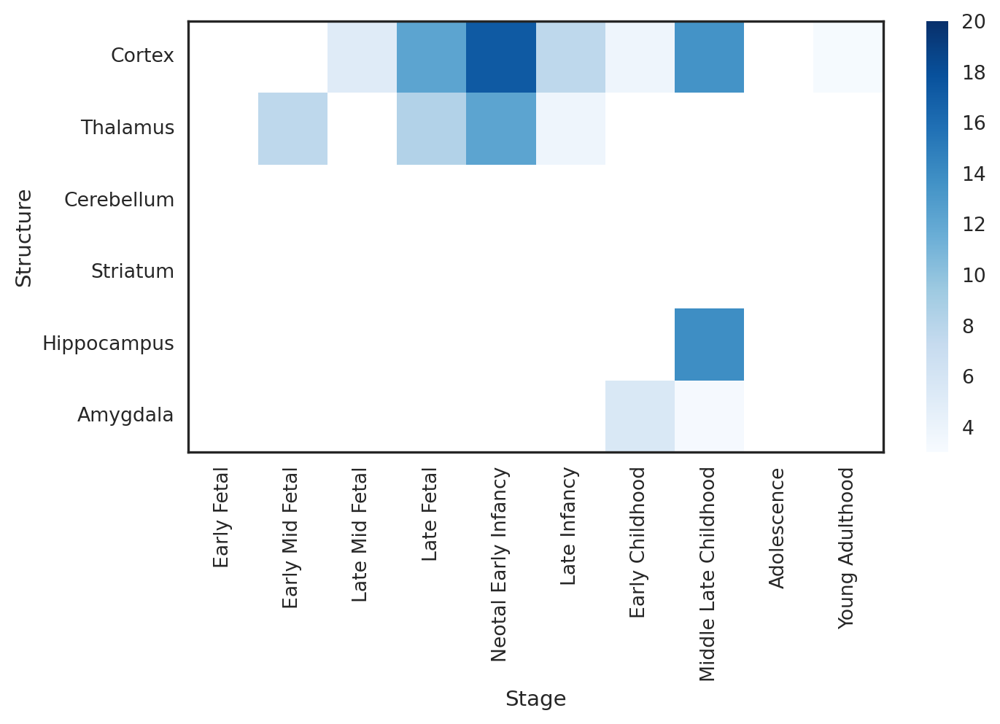

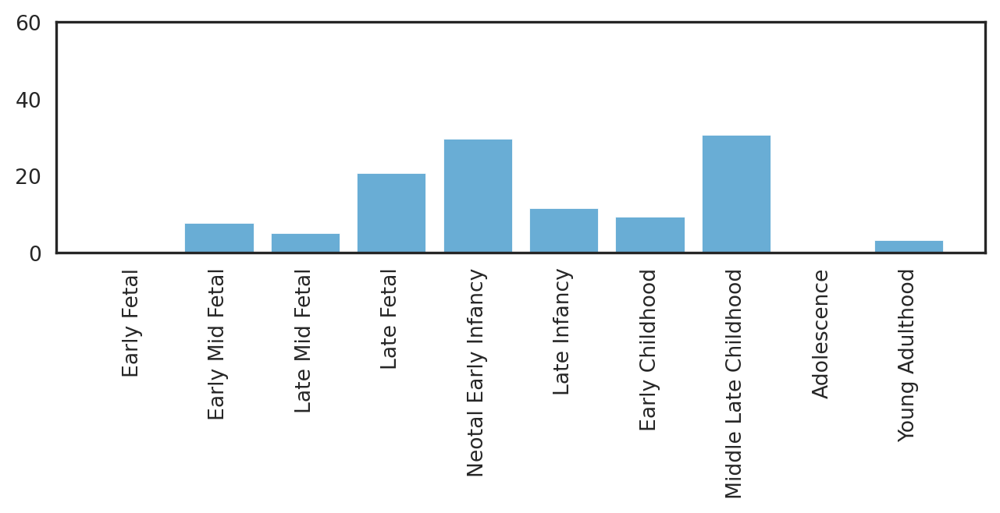

In [11]:
_ = helpers.run_csea_developmental(top_genes[0]['pos'], color='#69add5', cmap='Blues')

0 of 233 genes do not exist


/home/asaberi/laminar_organization/env/lib/python3.9/site-packages/brainspace/plotting/surface_plotting.py:437: RuntimeWarning: Running plot_hemispheres without a display may result in a crash. For a workaround please consult https://github.com/MICA-MNI/BrainSpace/issues/66. To suppress this warning set suppress_warnings=True.
  warnings.warn(


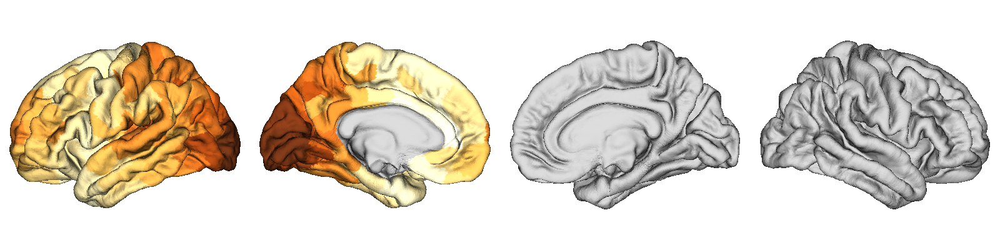

In [12]:
helpers.plot_surface(
    helpers.deparcellate(datasets.fetch_aggregate_gene_expression(top_genes[0]['neg'], 'schaefer400', ibf_threshold=0.5), 'schaefer400', space='fsaverage'),
    inflate=False, cmap='YlOrBr', plot_downsampled=False, space='fsaverage'
)

/home/asaberi/laminar_organization/code/figures/../helpers.py:996: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(stages_order, rotation=90);


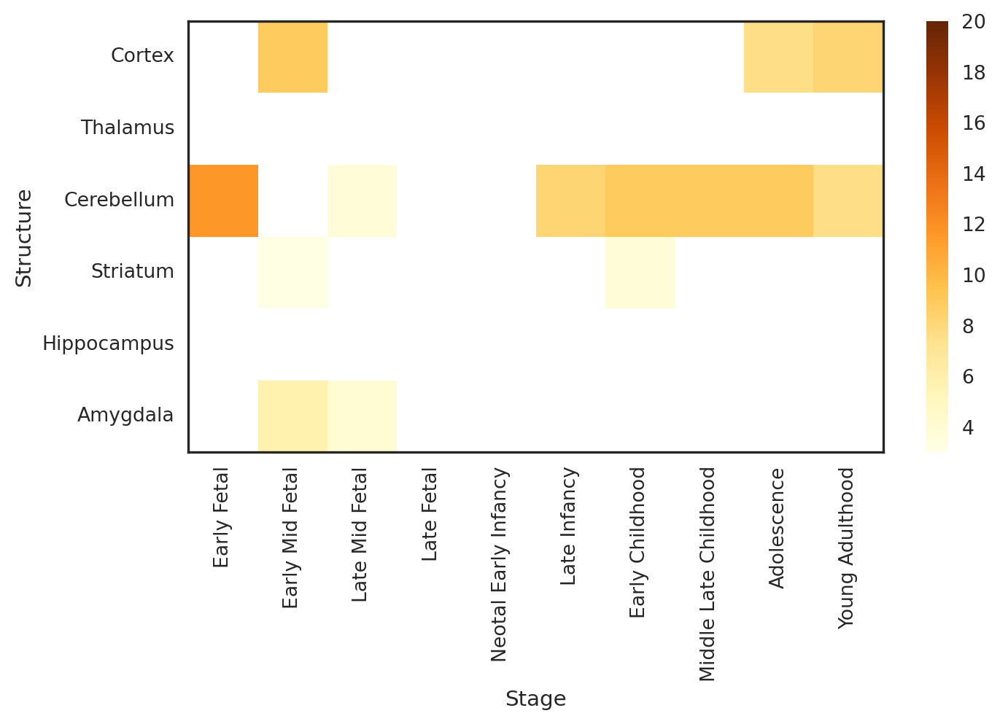

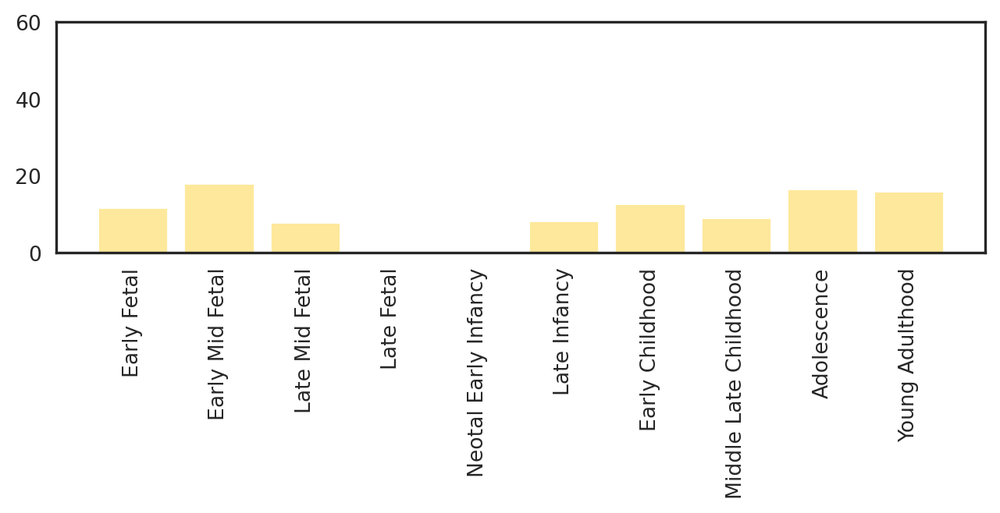

In [13]:
_ = helpers.run_csea_developmental(top_genes[0]['neg'], color='#fee89b', cmap='YlOrBr')